In [1]:
import osmnx as ox
import folium
import contextily as cx
import matplotlib.pyplot as plt

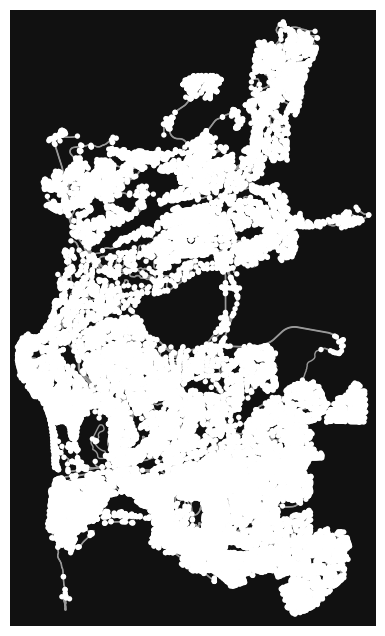

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [2]:
PLACE_NAME = 'San Diego, CA'
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G) 

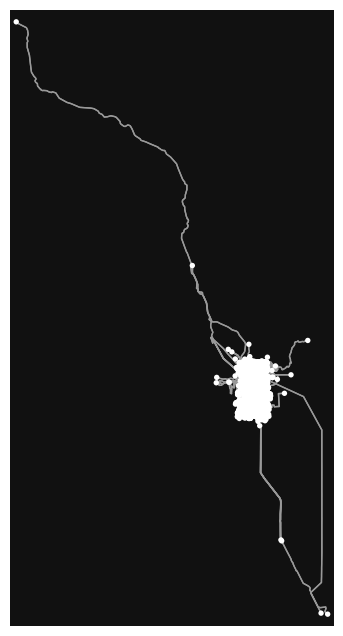

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [63]:
For_run = ox.graph_from_xml("C:\\Users\\Tyler Marino\\OneDrive\\Documents\\berkeley\\Cyplan-88\\StreetMapWork\\Encinitas_Alga.osm")
ox.plot_graph(For_run)

In [7]:
ox.plot_graph_folium(For_run)

C:\Users\Tyler Marino\AppData\Local\Temp\ipykernel_31108\2883279590.py:1: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(For_run)


In [87]:
nodes,edges = ox.graph_to_gdfs(For_run)
good_edges = edges[edges['name'].isna() == False]
origin = good_edges[good_edges['name'] == "Sitio Palmas"]
dest = good_edges[good_edges['name'] == "Via Almansa"]
nodes.head()

,y,x,highway,geometry
osmid,,,,
6150291535,33.106796,-117.268715,NaN,POINT (-117.26872 33.10680)
6150291567,33.106370,-117.268835,NaN,POINT (-117.26883 33.10637)
6150291568,33.106336,-117.268804,NaN,POINT (-117.26880 33.10634)
6924009631,33.099308,-117.244546,turning_loop,POINT (-117.24455 33.09931)
6150291786,33.105959,-117.268502,NaN,POINT (-117.26850 33.10596)


In [92]:
origin_node = ox.nearest_nodes(For_run, 33.10766,-117.24166)
destination_node = ox.nearest_nodes(For_run, 33.05094,-117.26335)
routes = ox.shortest_path(For_run, orig =origin_node, dest = destination_node)
routes


[1785455145]

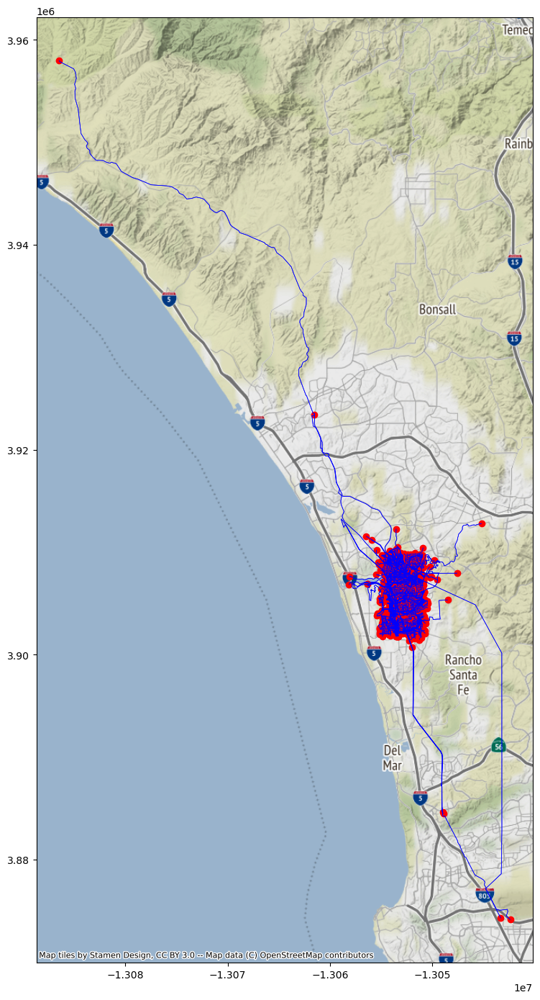

In [95]:
nodes_crs = nodes.to_crs('3857')
edges_crs = edges.to_crs('3857')

fig, ax = plt.subplots(figsize=(10, 14))
nodes_crs.plot(ax=ax, facecolor='red')
edges_crs.plot(ax=ax, linewidth=.5, edgecolor='blue')

plt.tight_layout()
cx.add_basemap(ax,crs=nodes_crs.crs.to_string())